In [1]:
import os
import sys
#__pkg = os.path.abspath(os.path.join(__file__, *('..'.split() * 2)))
#if __pkg not in sys.path:
#    sys.path.append(__pkg)

from functools import reduce

import cv2
import numpy as np
import pyvips

import torch
from torch import nn, Tensor

import torchvision
from torchvision.transforms import ToPILImage
import pandas as pd
from timeit import default_timer as timer 
import glob
import pdb
from concurrent.futures import ProcessPoolExecutor, as_completed
import psutil
import multiprocessing
from PIL import Image

In [65]:
def norm(x: Tensor):
    dims = tuple(range(1, len(x.size())))
    n = reduce(lambda a, b: a * b, x.size()[1:], 1)
    s1, s2 = [(x ** (i + 1)).sum(dim=tuple(range(1, len(x.size())))) for i in range(2)]
    return torch.as_tensor(n), s1 / n, s2 / n

def summarize(norms):
    n, s1, s2 = map(torch.stack, zip(*norms))
    factors = (n / n.sum()).unsqueeze(1)
    mean = (s1 * factors).sum(dim=0)
    std = ((s2 * factors).sum(dim=0) - (mean ** 2)).sqrt()
    return mean, std


def get_cropped(slide, level):
    x, y = [int(slide.get(f'openslide.bounds-{_}')) // (2 ** level) for _ in 'xy']
    return slide.crop(x, y, slide.width - x, slide.height - y)

def get_tiles(h, w, size, level):
    return [(y, x) for x in range(((w * (2 ** level)) // size) + 1) for y in range(((h * (2 ** level)) // size) + 1)]


def tile_mask(mask, size, f=None):
    if f is None:
        f = lambda a: a.sum() > 0

    ht, wt = np.array(mask.shape) // size
    ts = np.array([(y, x) for x in range(wt + 1) for y in range(ht + 1)])
    coords = np.concatenate([ts + i for i in range(2)], axis=1) * size

    keep = np.array([i for i, (y1, x1, y2, x2) in enumerate(coords) if f(mask[y1:y2, x1:x2])])
    return coords[keep], ts[keep][:, [1, 0]]

def fill_mask(mask, k, r=0):
    mask = cv2.blur(mask, (k, k))
    return (mask > (255 * r)).astype(np.uint8) * 255

def close_mask(mask, k, i):
    return cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((k, k)), iterations=i)

def mask_contours(mask):
    contours, _ = cv2.findContours(mask.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    return list(map(lambda t: t[0], sorted([(contour, cv2.contourArea(contour)) for contour in contours], key=lambda t: -t[1])))

def fill_contours(contours, shape):
    fill = np.zeros(shape, dtype=np.uint8)
    cv2.drawContours(fill, [contours[0],contours[1]], -1, 255, -1) 
    return fill

In [66]:
def extract_mask(filename):
    im = pyvips.Image.new_from_file(filename, level=2)
    hsv_image = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)
    lower_red1 = np.array([0, 50, 50])     # Lower range of red (hue 0-10)
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([100, 50, 50])   # Upper range of red (hue 170-180)
    upper_red2 = np.array([180, 255, 255])

    # Create masks for red
    mask1 = cv2.inRange(hsv_image, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv_image, lower_red2, upper_red2)
    red_mask = cv2.bitwise_or(mask1, mask2)
    cv2.imwrite('/gladstone/finkbeiner/steve/work/data/npsad_data/monika/mask.png', red_mask)
    return red_mask
    

In [67]:
level = 2
k1, i1, r1 = 9, 1, .01
k2, i2 = 9, 1

filled_mask = red_mask
contours = mask_contours(filled_mask)
filled_mask = fill_contours(contours, filled_mask.shape)

tile_size = 128
level=2

f_pos, f_neg = lambda _: _.sum() > 0, lambda _: _.sum() == 0
tiles_pos, coords_neg = tile_mask(filled_mask, tile_size, f=f_pos)[1], tile_mask(filled_mask, tile_size, f=f_neg)[0]
for y1, x1, y2, x2 in coords_neg:
    im[y1:y2, x1:x2] = 0
            
mask_out = ToPILImage()(filled_mask)

np.save(tile_name, tiles_pos, allow_pickle=False)
mask_out.save(mask_name)


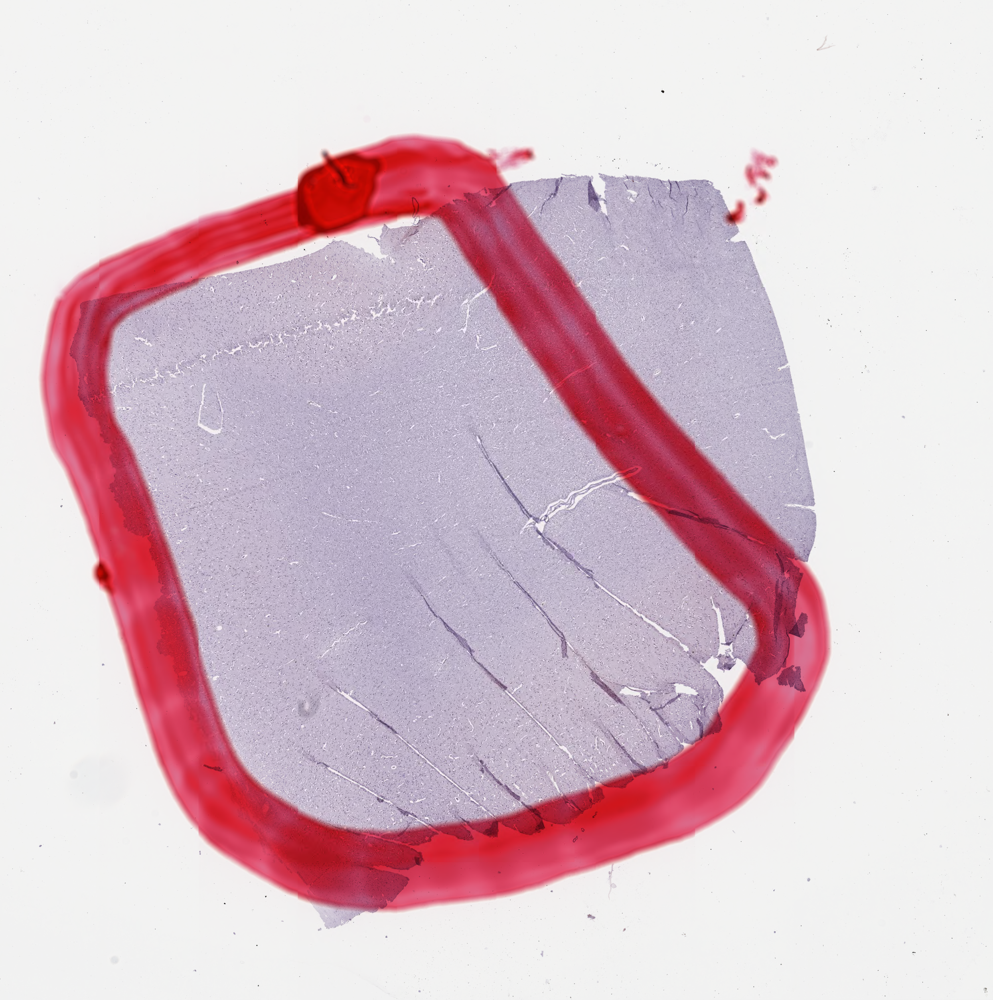

In [77]:
im = pyvips.Image.new_from_file("/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD_Dataset/LBD/PDD_cases/PDD_cases/PD001_Syn1_CG.svs", level=2)
#ToPILImage()(im) 
im2 = im.numpy()[:,:,:3]
ToPILImage()(im2) 

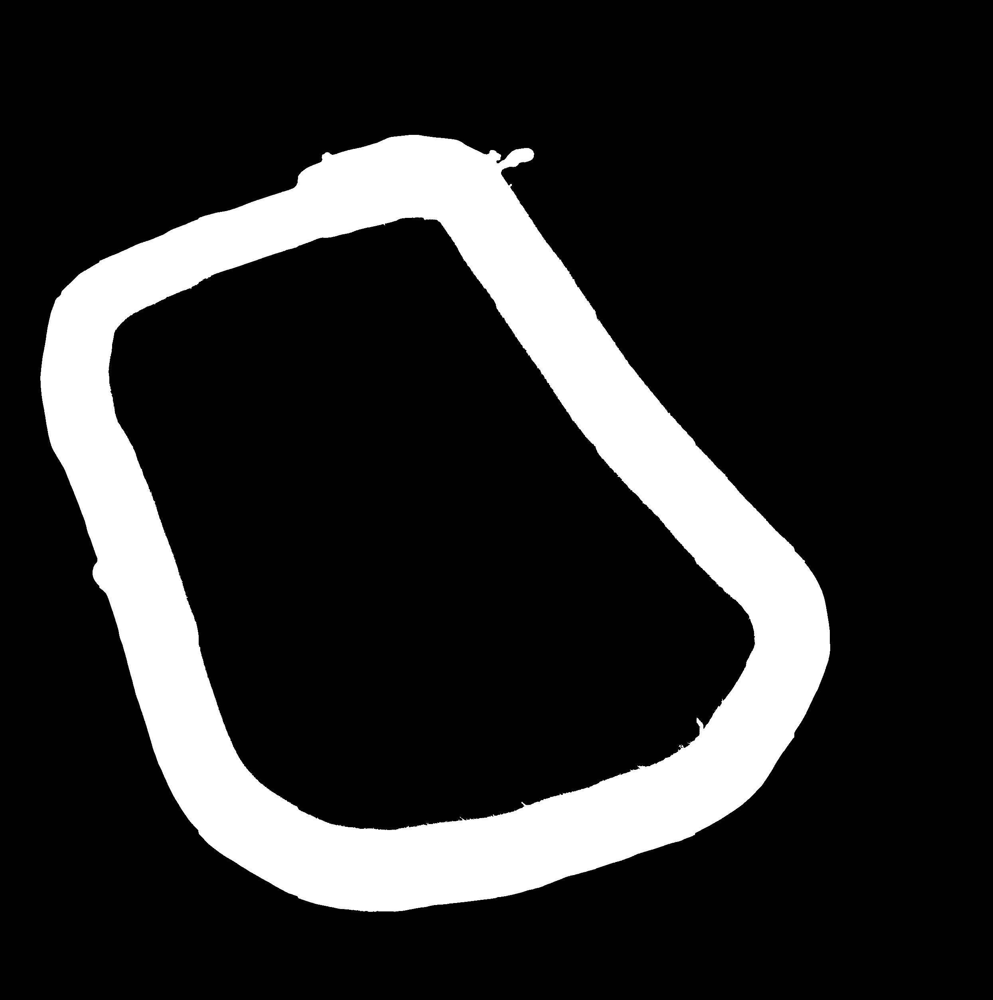

In [68]:
ToPILImage()(filled_mask) 

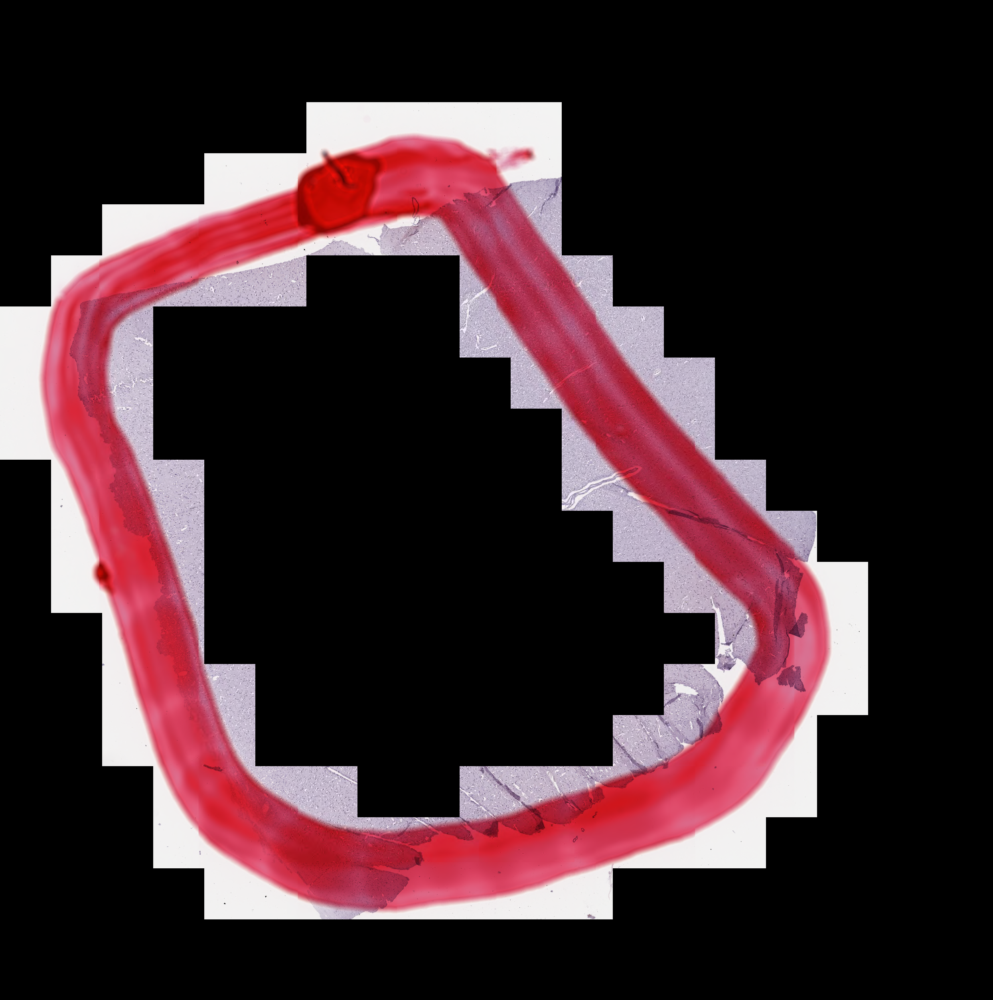

In [70]:
mask_out

In [ ]:

if __name__ == '__main__':
    #vips_img_dir = '/gladstone/finkbeiner/steve/work/data/npsad_data/vivek/amy-def-mfg-test'
    all_files = glob.glob(os.path.join("/gladstone/finkbeiner/steve/work/data/npsad_data/vivek/Datasets/New-Minerva-Data/finkbeiner-124208/Images","*.mrxs"))
    vips_img_fnames =  [i for i in all_files if i.endswith("_1_AmyB_1.mrxs")] # keeping only AMYB-MFG region images
    #vips_img_fnames =  [os.path.join("/gladstone/finkbeiner/steve/work/data/npsad_data/vivek/Datasets/New-Minerva-Data/finkbeiner-124208/Images","XE14-033_1_AmyB_1.mrxs")]
    
    out_dir = '/gladstone/finkbeiner/steve/work/data/npsad_data/vivek/Datasets/New-Minerva-Data-Test/tiles-npy'
    
    """
    csv_test_amyb_mdf = pd.read_csv("/gladstone/finkbeiner/steve/work/data/npsad_data/vivek/Metadata/overlap_with_metadata_srna_flag/AmyB-MFG_hasClinicalDataflag_hassnRNAflag.csv")
    vips_img_dir_new = csv_test_amyb_mdf[csv_test_amyb_mdf["hasClinicalData"]==True]["path"].values
    print(len(vips_img_dir_new))
    vips_img_names = os.listdir(out_dir)
    print(vips_img_names[:2])
    
    files_to_run = []
    for file in vips_img_dir_new:
        if file.split("/")[-1].split(".")[0]+".mask.png" in vips_img_names:
            files_to_run.append(file)
            
            
    print(len(files_to_run))
    out_dir_new = "/gladstone/finkbeiner/steve/work/data/npsad_data/vivek/Datasets/amyb_wsi/test-patients/images-npy"
    """
    
    
    
    
    
    
    #vips_img_skip = '07-057 08-018 09-006 09-041 10-005 10-006 10-009 10-018 10-019 10-020 10-021 10-026 11-008 11-018 11-025 11-029 12-009 12-023 12-031 12-036 13-028 14-033 16-027'
    #vips_img_names = next(os.walk(vips_img_dir))[2]
    #vips_img_names = [file[2:2 + 6] for file in vips_img_names]
    #vips_img_names = sorted(list(set(vips_img_names).difference(vips_img_skip)))

    #vips_img_fnames = [os.path.join(vips_img_dir, f'XE{vips_img_name}_1_AmyB_1.mrxs') for vips_img_name in vips_img_names]
    #vips_img_fnames = files_to_run

    tile_size = 128
    level = 3
    k1, i1, r1 = 9, 4, .01
    k2, i2 = 9, 4

    start = timer()
    for i, fname in enumerate(vips_img_fnames):
        print(fname)
        #print(i)
        name = os.path.join(out_dir, '.'.join(os.path.split(fname)[1].split('.')[:-1]))
        #name = os.path.join(out_dir_new, '.'.join(os.path.split(fname)[1].split('.')[:-1]))
        tile_name, mask_name, viz_name = [f'{name}.{suffix}' for suffix in ('tiles.npy', 'mask.png', 'viz.png')]
        #print(name,tile_name, mask_name, viz_name )
        
        try:
            slide = pyvips.Image.new_from_file(fname, level=level)
            pdb.set_trace()
        except pyvips.error.Error:
            print("error")
            pass
        
        # slide = get_cropped(slide, level)

        im = slide.numpy()[..., :3]        
        gray = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)
        #thresh, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
        thresh, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_TRIANGLE)

        filled_mask = mask
        for _ in range(i1):
            filled_mask = fill_mask(filled_mask, k1, r1)
        filled_mask = close_mask(filled_mask, k2, i2)
        contours = mask_contours(filled_mask)
        filled_mask = fill_contours(contours[:1], filled_mask.shape)

        f_pos, f_neg = lambda _: _.sum() > 0, lambda _: _.sum() == 0
        tiles_pos, coords_neg = tile_mask(filled_mask, tile_size, f=f_pos)[1], tile_mask(filled_mask, tile_size, f=f_neg)[0]

        for y1, x1, y2, x2 in coords_neg:
            im[y1:y2, x1:x2] = 0
            
        mask_out = ToPILImage()(filled_mask)
        #viz_out = ToPILImage()(im)

        np.save(tile_name, tiles_pos, allow_pickle=False)
        mask_out.save(mask_name)
        #viz_out.save(viz_name)
    print("total time taken for 324 files",timer()-start)
   